№1 Завдання щодо машинного перекладу на базі рекурентних мереж.

In [1]:
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn as nn
import urllib.request
import numpy as np
import zipfile, torch, random, time, os

# Завантаження і підготовка даних
url = "https://www.manythings.org/anki/ukr-eng.zip"
file_name = "ukr-eng.zip"
data_dir = "ukr-eng"

if not os.path.exists(data_dir):
    req = urllib.request.Request(url, headers={'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'})
    with urllib.request.urlopen(req) as response, open(file_name, 'wb') as out_file:
        data = response.read()
        out_file.write(data)
    with zipfile.ZipFile(file_name, 'r') as zip_ref:
        zip_ref.extractall()

with open('ukr.txt', 'r', encoding='utf-8') as f:
    pairs = []
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 2:
            eng = parts[0].lower().strip()
            ukr = parts[1].lower().strip()
            if 2 <= len(eng.split()) <= 20 and 2 <= len(ukr.split()) <= 20:
                pairs.append((ukr, eng))

print(f"Завантажено {len(pairs)} пар речень")
print(f"Приклад: {pairs[0]}")

Завантажено 159363 пар речень
Приклад: ('зроби це.', 'do it.')


In [2]:
# Розділення на train/val/test
random.shuffle(pairs)
train_size = int(0.7 * len(pairs))
val_size = int(0.15 * len(pairs))

train_pairs = pairs[:train_size]
val_pairs = pairs[train_size:train_size + val_size]
test_pairs = pairs[train_size + val_size:]

print(f"   Train: {len(train_pairs)} пар")
print(f"   Val:   {len(val_pairs)} пар")
print(f"   Test:  {len(test_pairs)} пар")

# Побудова словників
class Lang:
    def __init__(self, name):
        self.name = name
        self.word2idx = {'<PAD>': 0, '<SOS>': 1, '<EOS>': 2}
        self.idx2word = {0: '<PAD>', 1: '<SOS>', 2: '<EOS>'}
        self.word2count = {}
        self.n_words = 3

    def add_sentence(self, sentence):
        for word in sentence.split():
            self.add_word(word)

    def add_word(self, word):
        if word not in self.word2idx:
            self.word2idx[word] = self.n_words
            self.idx2word[self.n_words] = word
            self.word2count[word] = 1
            self.n_words += 1
        else:
            self.word2count[word] += 1

source_lang = Lang('ukr')
target_lang = Lang('eng')

for ukr, eng in train_pairs:
    source_lang.add_sentence(ukr)
    target_lang.add_sentence(eng)

print(f"   Український словник: {source_lang.n_words} слів")
print(f"   Англійський словник: {target_lang.n_words} слів")

# Підготовка датасету
class TranslationDataset(Dataset):
    def __init__(self, pairs, source_lang, target_lang, max_length=20):
        self.pairs = pairs
        self.source_lang = source_lang
        self.target_lang = target_lang
        self.max_length = max_length

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        source, target = self.pairs[idx]

        source_ids = [self.source_lang.word2idx['<SOS>']]
        for word in source.split():
            if word in self.source_lang.word2idx:
                source_ids.append(self.source_lang.word2idx[word])
        source_ids.append(self.source_lang.word2idx['<EOS>'])

        target_ids = [self.target_lang.word2idx['<SOS>']]
        for word in target.split():
            if word in self.target_lang.word2idx:
                target_ids.append(self.target_lang.word2idx[word])
        target_ids.append(self.target_lang.word2idx['<EOS>'])

        source_ids = source_ids[:self.max_length]
        source_ids += [self.source_lang.word2idx['<PAD>']] * (self.max_length - len(source_ids))

        target_ids = target_ids[:self.max_length]
        target_ids += [self.target_lang.word2idx['<PAD>']] * (self.max_length - len(target_ids))

        return (torch.tensor(source_ids, dtype=torch.long),
                torch.tensor(target_ids, dtype=torch.long))

batch_size = 32
train_dataset = TranslationDataset(train_pairs, source_lang, target_lang)
val_dataset   = TranslationDataset(val_pairs, source_lang, target_lang)
test_dataset  = TranslationDataset(test_pairs, source_lang, target_lang)
train_loader  = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader    = DataLoader(val_dataset, batch_size=batch_size)
test_loader   = DataLoader(test_dataset, batch_size=batch_size)


# SEQ2SEQ З LSTM
class Encoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, n_layers=1, dropout=0.5):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, n_layers,
                            dropout=dropout if n_layers > 1 else 0,
                            batch_first=True)

    def forward(self, src):
        embedded = self.embedding(src)
        outputs, (hidden, cell) = self.lstm(embedded)
        return hidden, cell

class Decoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, n_layers=1, dropout=0.5):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, n_layers,
                            dropout=dropout if n_layers > 1 else 0,
                            batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)

    def forward(self, tgt, hidden, cell):
        embedded = self.embedding(tgt)
        output, (hidden, cell) = self.lstm(embedded, (hidden, cell))
        prediction = self.fc(output)
        return prediction, hidden, cell

class Seq2Seq(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, src, tgt, teacher_forcing_ratio=0.5):
        batch_size = src.shape[0]
        tgt_len = tgt.shape[1]

        hidden, cell = self.encoder(src)

        decoder_input = tgt[:, 0].unsqueeze(1)
        predictions = []

        for t in range(1, tgt_len):
            prediction, hidden, cell = self.decoder(decoder_input, hidden, cell)
            predictions.append(prediction)

            if random.random() < teacher_forcing_ratio:
                decoder_input = tgt[:, t].unsqueeze(1)
            else:
                decoder_input = prediction.argmax(2)

        return torch.cat(predictions, dim=1)

# Навчання моделі
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
embedding_dim = 128
hidden_dim = 256
n_layers = 2
encoder = Encoder(source_lang.n_words, embedding_dim, hidden_dim, n_layers)
decoder = Decoder(target_lang.n_words, embedding_dim, hidden_dim, n_layers)
model = Seq2Seq(encoder, decoder).to(device)

optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss(ignore_index=0)
num_epochs = 10
best_val_loss = float('inf')

for epoch in range(num_epochs):
    tf = max(0.1, 0.5 - epoch * 0.04)
    model.train()
    total_loss = 0

    for src, tgt in train_loader:
        src = src.to(device)
        tgt = tgt.to(device)

        optimizer.zero_grad()
        predictions = model(src, tgt, teacher_forcing_ratio=tf)
        loss = criterion(predictions.reshape(-1, target_lang.n_words), tgt[:, 1:].reshape(-1))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for src, tgt in val_loader:
            src = src.to(device)
            tgt = tgt.to(device)
            predictions = model(src, tgt, teacher_forcing_ratio=0)
            loss = criterion(predictions.reshape(-1, target_lang.n_words), tgt[:, 1:].reshape(-1))
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)

    print(f"   Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'seq2seq_model.pt')

# Тестування моделі
def translate(sentence, model, source_lang, target_lang, device, max_length=20):
    model.eval()
    tokens = ['<SOS>'] + sentence.lower().split() + ['<EOS>']
    tokens = tokens[:max_length]
    tokens += ['<PAD>'] * (max_length - len(tokens))

    src_indices = [source_lang.word2idx.get(token, source_lang.word2idx['<PAD>']) for token in tokens]
    src_tensor = torch.tensor(src_indices, dtype=torch.long).unsqueeze(0).to(device)

    with torch.no_grad():
        hidden, cell = model.encoder(src_tensor)

        decoder_input = torch.tensor([[target_lang.word2idx['<SOS>']]], dtype=torch.long).to(device)
        translated_tokens = []

        for _ in range(max_length):
            prediction, hidden, cell = model.decoder(decoder_input, hidden, cell)
            predicted_idx = prediction.argmax(2).item()

            if predicted_idx == target_lang.word2idx['<EOS>']:
                break

            translated_tokens.append(target_lang.idx2word[predicted_idx])
            decoder_input = torch.tensor([[predicted_idx]], dtype=torch.long).to(device)

    return ' '.join(translated_tokens)

# Тестування
model.load_state_dict(torch.load('seq2seq_model.pt', map_location=device))

for i in range(min(5, len(test_pairs))):
    ukr, eng = test_pairs[i]
    predicted = translate(ukr, model, source_lang, target_lang, device)
    print(f"\n   Українська:  {ukr}")
    print(f"   Англійська (очікувана): {eng}")
    print(f"   Англійська (передбачена): {predicted}")

   Train: 111554 пар
   Val:   23904 пар
   Test:  23905 пар
   Український словник: 40915 слів
   Англійський словник: 16787 слів
   Epoch 1/10 | Train Loss: 4.4915 | Val Loss: 4.0578
   Epoch 2/10 | Train Loss: 3.3932 | Val Loss: 3.4891
   Epoch 3/10 | Train Loss: 2.8794 | Val Loss: 3.1825
   Epoch 4/10 | Train Loss: 2.5296 | Val Loss: 2.9603
   Epoch 5/10 | Train Loss: 2.2554 | Val Loss: 2.8115
   Epoch 6/10 | Train Loss: 2.0466 | Val Loss: 2.7243
   Epoch 7/10 | Train Loss: 1.8697 | Val Loss: 2.6484
   Epoch 8/10 | Train Loss: 1.7237 | Val Loss: 2.6048
   Epoch 9/10 | Train Loss: 1.6035 | Val Loss: 2.5939
   Epoch 10/10 | Train Loss: 1.5015 | Val Loss: 2.5742

   Українська:  це залежить від тебе.
   Англійська (очікувана): it depends on you.
   Англійська (передбачена): it's depends on you.

   Українська:  том тебе запитав, чому ти це зробив?
   Англійська (очікувана): did tom ask you why you did that?
   Англійська (передбачена): did tom ask you why did did that?

   Українська:

№2 Завдання щодо генерації зображень (DCGAN).

In [4]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import torch

# Завантаження датасету CIFAR-100
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
train_dataset = datasets.CIFAR100(
    root='./data', train=True, download=True, transform=transform
)
cifar100_classes = train_dataset.classes
target_class = 60
class_name = cifar100_classes[target_class]
indices = [i for i, (_, y) in enumerate(train_dataset) if y == target_class]
sampler = torch.utils.data.SubsetRandomSampler(indices)
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
print(f"Кількість зображень для навчання: {len(indices)}")

100%|██████████| 169M/169M [00:05<00:00, 29.3MB/s]


Кількість зображень для навчання: 500


   ✓ DCGAN готова (device=cuda)
   Generator parameters: 1,072,512
   Discriminator parameters: 663,296
   Epoch 1/100 | D Loss: 0.665300 | G Loss: 1.798172
   Epoch 2/100 | D Loss: 0.299423 | G Loss: 2.483220
   Epoch 3/100 | D Loss: 0.242457 | G Loss: 2.734400
   Epoch 4/100 | D Loss: 0.167735 | G Loss: 3.134151
   Epoch 5/100 | D Loss: 0.114927 | G Loss: 3.383765
   Epoch 6/100 | D Loss: 0.094610 | G Loss: 3.692175
   Epoch 7/100 | D Loss: 0.076651 | G Loss: 3.801257
   Epoch 8/100 | D Loss: 0.060407 | G Loss: 4.044499
   Epoch 9/100 | D Loss: 0.054607 | G Loss: 4.144540
   Epoch 10/100 | D Loss: 0.043821 | G Loss: 4.350598
   Epoch 11/100 | D Loss: 0.042535 | G Loss: 4.503841
   Epoch 12/100 | D Loss: 0.047075 | G Loss: 4.433438
   Epoch 13/100 | D Loss: 0.041750 | G Loss: 4.525033
   Epoch 14/100 | D Loss: 0.051622 | G Loss: 4.578497
   Epoch 15/100 | D Loss: 0.555855 | G Loss: 4.783021
   Epoch 16/100 | D Loss: 0.197029 | G Loss: 3.832556
   Epoch 17/100 | D Loss: 0.121804 | G Lo

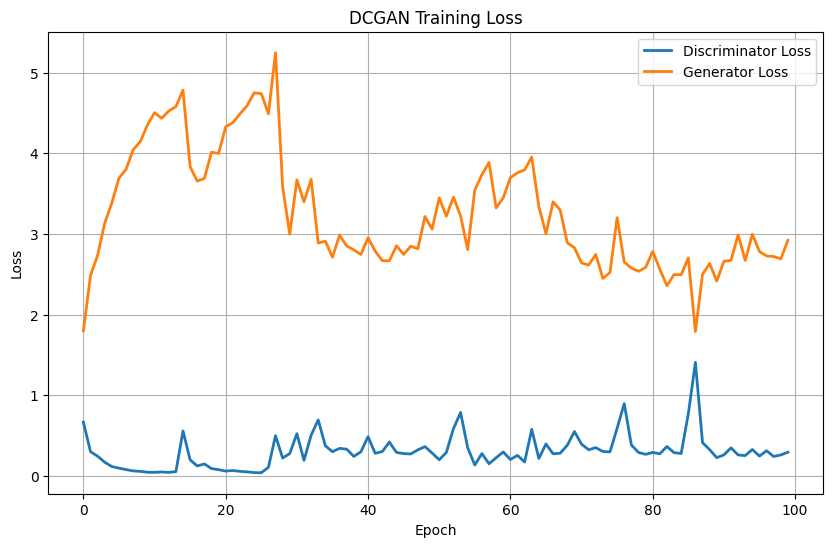

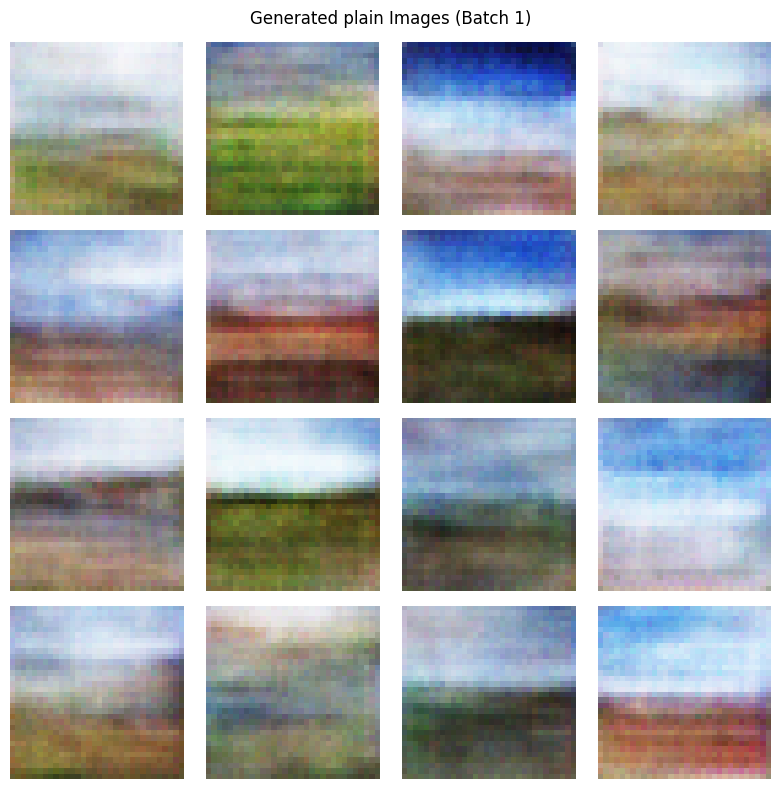

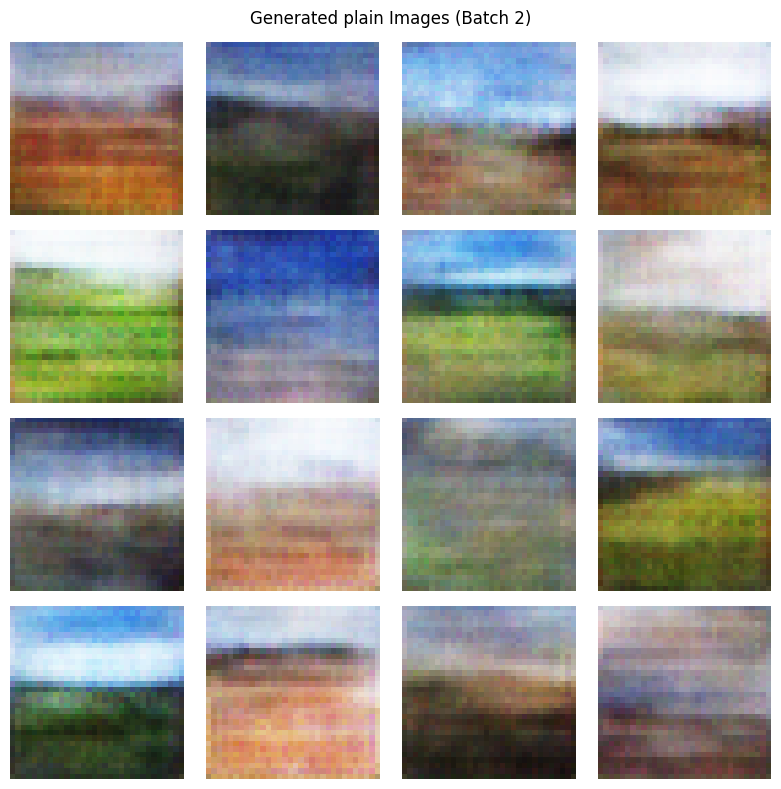

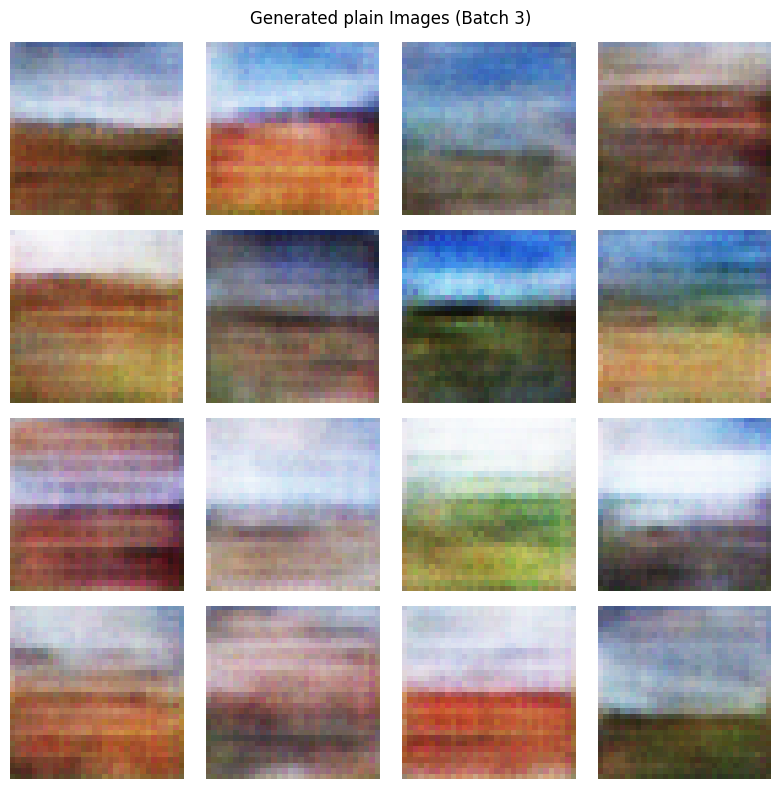

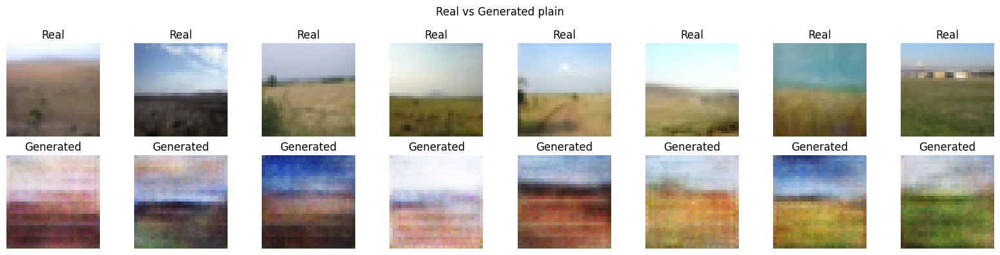

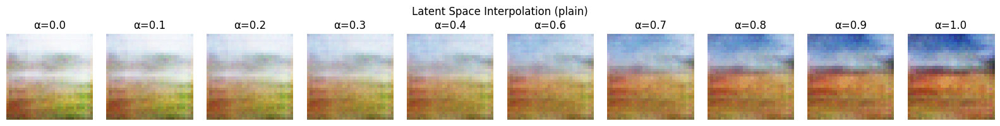

In [10]:
# DCGAN
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super().__init__()
        self.latent_dim = latent_dim

        self.fc = nn.Linear(latent_dim, 256 * 4 * 4)
        self.main = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    def forward(self, z):
        x = self.fc(z)
        x = x.view(-1, 256, 4, 4)
        x = self.main(x)
        return x


class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.main(x)
        return x.view(-1, 1).squeeze(1)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
latent_dim = 100
generator = Generator(latent_dim=latent_dim).to(device)
discriminator = Discriminator().to(device)

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

generator.apply(weights_init)
discriminator.apply(weights_init)

lr = 0.0001
beta1 = 0.5
optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
criterion = nn.BCELoss()

print(f"   ✓ DCGAN готова (device={device})")
print(f"   Generator parameters: {sum(p.numel() for p in generator.parameters()):,}")
print(f"   Discriminator parameters: {sum(p.numel() for p in discriminator.parameters()):,}")

# Навчання моделі
num_epochs = 100
fixed_noise = torch.randn(16, latent_dim, device=device)
losses_g = []
losses_d = []

for epoch in range(num_epochs):
    total_loss_d = 0
    total_loss_g = 0
    batch_count = 0

    for real_images, _ in train_loader:
        real_images = real_images.to(device)
        batch_size_real = real_images.size(0)

        optimizer_d.zero_grad()
        real_labels = torch.ones(batch_size_real, device=device)
        fake_labels = torch.zeros(batch_size_real, device=device)

        d_real_output = discriminator(real_images)
        loss_d_real = criterion(d_real_output, real_labels)

        z = torch.randn(batch_size_real, latent_dim, device=device)
        fake_images = generator(z)
        d_fake_output = discriminator(fake_images.detach())
        loss_d_fake = criterion(d_fake_output, fake_labels)

        loss_d = loss_d_real + loss_d_fake
        loss_d.backward()
        optimizer_d.step()

        optimizer_g.zero_grad()

        z = torch.randn(batch_size_real, latent_dim, device=device)
        fake_images = generator(z)
        d_fake_output = discriminator(fake_images)

        loss_g = criterion(d_fake_output, real_labels)
        loss_g.backward()
        optimizer_g.step()

        total_loss_d += loss_d.item()
        total_loss_g += loss_g.item()
        batch_count += 1

    avg_loss_d = total_loss_d / batch_count
    avg_loss_g = total_loss_g / batch_count
    losses_d.append(avg_loss_d)
    losses_g.append(avg_loss_g)

    print(f"   Epoch {epoch+1}/{num_epochs} | D Loss: {avg_loss_d:.6f} | G Loss: {avg_loss_g:.6f}")

torch.save(generator.state_dict(), 'dcgan_generator.pt')
torch.save(discriminator.state_dict(), 'dcgan_discriminator.pt')

# Візуалізація loss-кривих
plt.figure(figsize=(10, 6))
plt.plot(losses_d, label='Discriminator Loss', linewidth=2)
plt.plot(losses_g, label='Generator Loss', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('DCGAN Training Loss')
plt.legend()
plt.grid(True)
plt.show()

# Генерація зображень
generator.eval()
def denormalize(img):
    return (img * 0.5 + 0.5).clamp(0, 1)

num_batches_to_generate = 3

for batch_idx in range(num_batches_to_generate):
    with torch.no_grad():
        z = torch.randn(16, latent_dim, device=device)
        fake_images = generator(z)
        fake_images = denormalize(fake_images).cpu()

    fig, axes = plt.subplots(4, 4, figsize=(8, 8))
    for i in range(16):
        ax = axes[i // 4, i % 4]
        img = fake_images[i].permute(1, 2, 0).numpy()
        ax.imshow(img)
        ax.axis('off')

    plt.suptitle(f'Generated {class_name} Images (Batch {batch_idx+1})')
    plt.tight_layout()
    plt.show()

real_batch = next(iter(train_loader))[0][:8].to(device)
real_images_denorm = denormalize(real_batch).cpu()

with torch.no_grad():
    z = torch.randn(8, latent_dim, device=device)
    fake_images = generator(z)
    fake_images_denorm = denormalize(fake_images).cpu()

fig, axes = plt.subplots(2, 8, figsize=(16, 4))

for i in range(8):
    real_img = real_images_denorm[i].permute(1, 2, 0).numpy()
    axes[0, i].imshow(real_img)
    axes[0, i].set_title('Real')
    axes[0, i].axis('off')

    fake_img = fake_images_denorm[i].permute(1, 2, 0).numpy()
    axes[1, i].imshow(fake_img)
    axes[1, i].set_title('Generated')
    axes[1, i].axis('off')

plt.suptitle(f'Real vs Generated {class_name}')
plt.tight_layout()
plt.show()

z1 = torch.randn(1, latent_dim, device=device)
z2 = torch.randn(1, latent_dim, device=device)
num_steps = 10

fig, axes = plt.subplots(1, num_steps, figsize=(16, 2))

with torch.no_grad():
    for step in range(num_steps):
        alpha = step / (num_steps - 1)
        z_interp = (1 - alpha) * z1 + alpha * z2
        img = generator(z_interp)
        img_denorm = denormalize(img).cpu()

        axes[step].imshow(img_denorm[0].permute(1, 2, 0).numpy())
        axes[step].set_title(f'α={alpha:.1f}')
        axes[step].axis('off')

plt.suptitle(f'Latent Space Interpolation ({class_name})')
plt.tight_layout()
plt.show()

№3 Генерація зображень з Hugging Face Diffusers, задача Text-to-Image за допомогою pipeline.

In [11]:
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
import time, torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float32 if device.type == 'cpu' else torch.float16
).to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

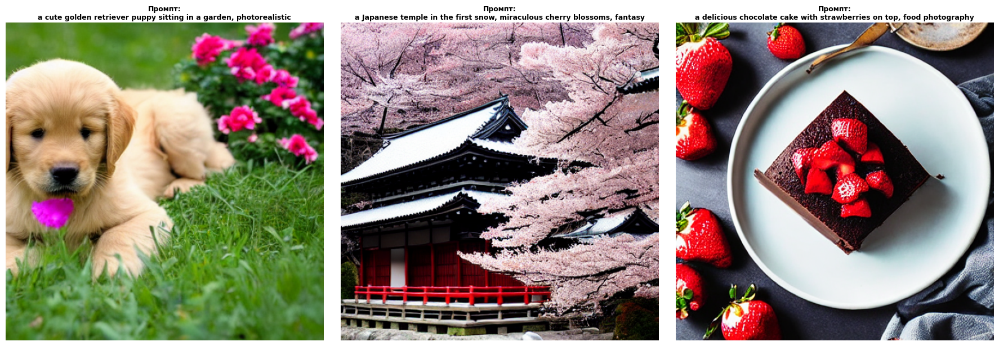

In [13]:
# Базова генерація
prompts = [
    "a cute golden retriever puppy sitting in a garden, photorealistic",
    "a Japanese temple in the first snow, miraculous cherry blossoms, fantasy",
    "a delicious chocolate cake with strawberries on top, food photography",
]

def show_image(img, title=""):
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

generated_images = []

for i, prompt in enumerate(prompts):
    start_time = time.time()
    with torch.no_grad():
        image = pipe(
            prompt=prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            height=512,
            width=512,
            num_images_per_prompt=1
        ).images[0]

    elapsed_time = time.time() - start_time

    generated_images.append(image)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (img, prompt) in enumerate(zip(generated_images, prompts)):
    axes[i].imshow(img)
    axes[i].set_title(f"Промпт:\n{prompt}", fontsize=9, fontweight='bold', wrap=True)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Промпт: 'a majestic wolf above mountains, photorealistic'


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

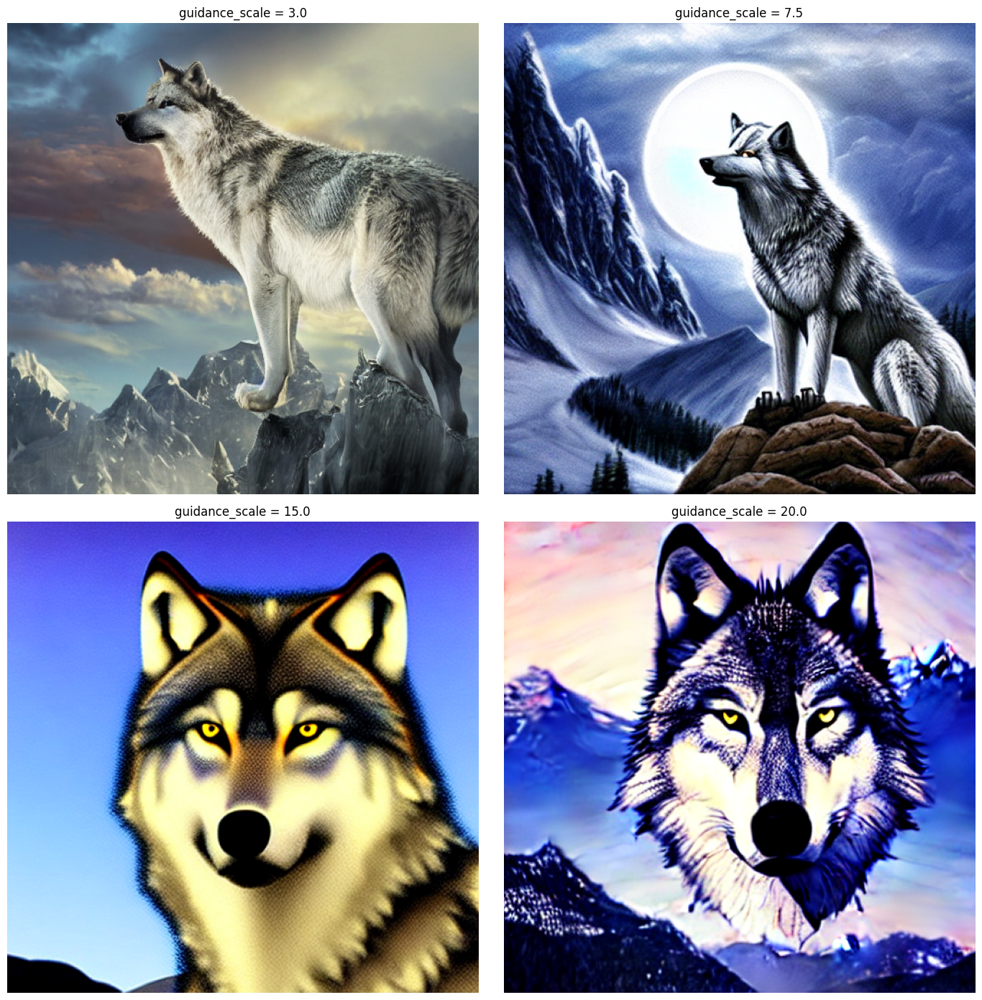

In [17]:
# Вплив GUIDANCE SCALE
test_prompt = "a majestic wolf above mountains, photorealistic"
guidance_scales = [3.0, 7.5, 15.0, 20.0]
guidance_results = []

print(f"Промпт: '{test_prompt}'")

for guidance_scale in guidance_scales:
    with torch.no_grad():
        image = pipe(
            prompt=test_prompt,
            num_inference_steps=50,
            guidance_scale=guidance_scale,
            height=512,
            width=512
        ).images[0]
    guidance_results.append(image)

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
for idx, (guidance_val, img) in enumerate(zip(guidance_scales, guidance_results)):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(img)
    ax.set_title(f'guidance_scale = {guidance_val}', fontsize=12)
    ax.axis('off')
plt.tight_layout()
plt.show()

Промпт: 'ship at the desert, 8k, photorealistic'


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

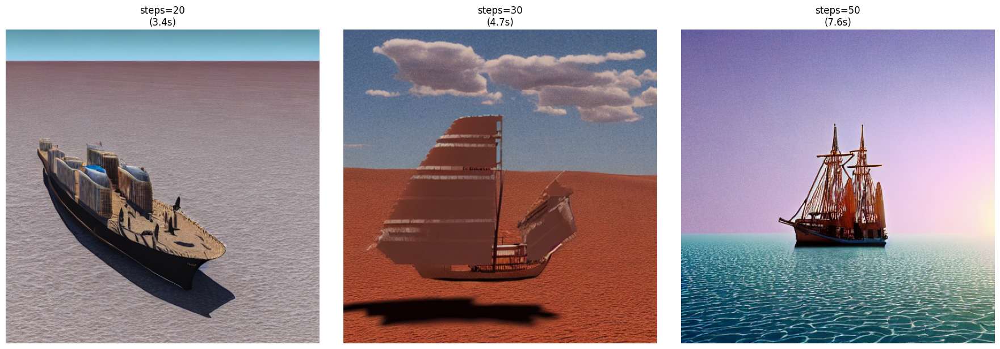

In [23]:
# Вплив кількості кроків
test_prompt2 = "ship at the desert, 8k, photorealistic"
steps_list = [20, 30, 50]
steps_results = []
steps_times = []

print(f"Промпт: '{test_prompt2}'")

for num_steps in steps_list:
    start_time = time.time()
    with torch.no_grad():
        image = pipe(
            prompt=test_prompt2,
            num_inference_steps=num_steps,
            guidance_scale=7.5,
            height=512,
            width=512
        ).images[0]
    elapsed_time = time.time() - start_time
    steps_results.append(image)
    steps_times.append(elapsed_time)

fig, axes = plt.subplots(1, len(steps_list), figsize=(6 * len(steps_list), 6))
if len(steps_list) == 1:
    axes = [axes]
for ax, img, num_steps, t in zip(axes, steps_results, steps_list, steps_times):
    ax.imshow(img)
    ax.set_title(f"steps={num_steps}\n({t:.1f}s)", fontsize=12)
    ax.axis('off')
plt.tight_layout()
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

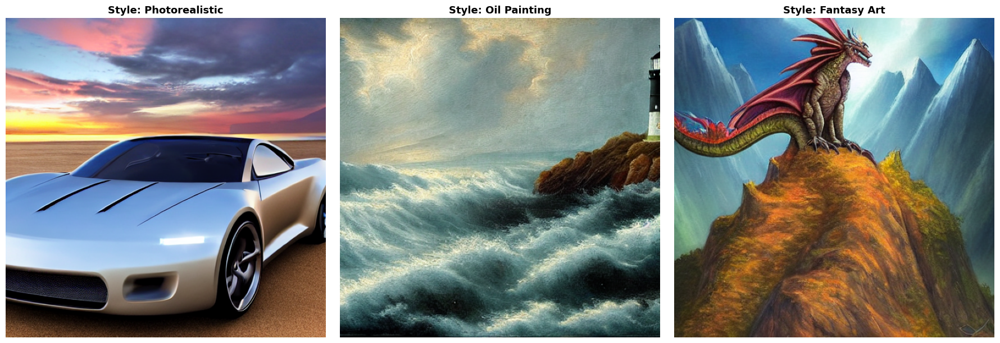

In [25]:
# Генерація зображень в певному стилі
style_prompts = {
    "Photorealistic": "a luxury sports car parked on a beach at sunset, photorealistic, 8k",
    "Oil Painting": "a stormy sea with a lighthouse on a cliff, oil painting, masterpiece",
    "Fantasy Art": "a fantasy dragon perched on a mountain top, magical aura, fantasy art",
}
style_results = {}

for style_name, prompt in style_prompts.items():
    with torch.no_grad():
        image = pipe(
            prompt=prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            height=512,
            width=512
        ).images[0]
    style_results[style_name] = image

fig, axes = plt.subplots(1, len(style_results), figsize=(6*len(style_results), 6))
if len(style_results) == 1:
    axes = [axes]
for i, (style_name, image) in enumerate(style_results.items()):
    axes[i].imshow(image)
    axes[i].set_title(f"Style: {style_name}", fontsize=13, fontweight='bold')
    axes[i].axis('off')
plt.tight_layout()
plt.show()
